<a href="https://colab.research.google.com/github/Coolinglass/Applied-Machine-Learning-Projects/blob/master/Exploratory_Data_Analysis_(EDA).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Notebook Structure

1. Problem Statement and Data Description
2. Loading Datasets and Libraries
3. Understanding and Validating the Data
4. Data Exploration - Train, Product, Store

# 1. Problem Statement and Data Description

**Problem Statement:**
Prevent overstocking and understocking of Items by forecasting demand of items for the next week, based on historical data.

**Data Description:**

Train Data-
- **WEEK_END_DATE** - week ending date
- **STORE_NUM** - store number
- **UPC** - (Universal Product Code) product specific identifier
- **BASE_PRICE** - base price of item
- **DISPLAY** - product was a part of in-store promotional display
- **FEATURE** - product was in in-store circular
- **UNITS** - units sold (target)

Product Data-
- **UPC** - (Universal Product Code) product specific identifier
- **DESCRIPTION**	- product description
- **MANUFACTURER** - product	manufacturer
- **CATEGORY** - category of product
- **SUB_CATEGORY** - sub-category of product
- **PRODUCT_SIZE** - package size or quantity of product

Store Data-
- **STORE_ID** - store number
- **STORE_NAME** - Name of store
- **ADDRESS_CITY_NAME** - city
- **ADDRESS_STATE_PROV_CODE** - state
- **MSA_CODE** - (Metropolitan Statistical Area) Based on geographic region and population density
- **SEG_VALUE_NAME** - Store Segment Name
- **PARKING_SPACE_QTY** - number of parking spaces in the store parking lot
- **SALES_AREA_SIZE_NUM** - square footage of store
- **AVG_WEEKLY_BASKETS** - average weekly baskets sold in the store

# 2. Loading Required Libraries and Datasets

In [5]:
import seaborn as sns
import pandas as pd
import numpy as np
import random

sns.set_context('notebook',font_scale=1.5)

import matplotlib.pyplot as plt


import warnings
warnings.filterwarnings("ignore")

We are provided with three tables containing the required information:

- **product_data**: Consists of details about the product
- **store_data**: Consists of details of various stores associated with the retailer  
- **train**: Contains transaction data of products

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
# reading the data files
train = pd.read_csv('/content/drive/MyDrive/Analytics Vidhya/EDA Datasets & Notebook for Bigmart sales data/train.csv')
product_data = pd.read_csv('/content/drive/MyDrive/Analytics Vidhya/EDA Datasets & Notebook for Bigmart sales data/product_data.csv')
store_data = pd.read_csv('/content/drive/MyDrive/Analytics Vidhya/EDA Datasets & Notebook for Bigmart sales data/store_data.csv')

In [8]:
# checking the size of the dataframes
train.shape, product_data.shape, store_data.shape

((232287, 8), (30, 6), (76, 9))

# 3. Understanding and Validating Data

### Train Data

In [137]:
# Understanding the first 5 rows and our data types for our data
train.head()

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
0,2009-01-14,367,1111009477,1.39,1.57,0,0,13
1,2009-01-14,367,1111009497,1.39,1.39,0,0,20
2,2009-01-14,367,1111085319,1.88,1.88,0,0,14
3,2009-01-14,367,1111085345,1.88,1.88,0,0,29
4,2009-01-14,367,1111085350,1.98,1.98,0,0,35


In [138]:

train.dtypes

,0
WEEK_END_DATE,datetime64[ns]
STORE_NUM,int64
UPC,int64
PRICE,float64
BASE_PRICE,float64
FEATURE,int64
DISPLAY,int64
UNITS,int64


- WEEK_END_DATE has the data type object, but its a datetime variable
- The store number and product codes are read as int, but these are categorical variables.

#### Datetime variable

- The data is captured for what duration?
- What are the start and end dates?
- Is there any missing data points?

#### Numerical Variables

- Check the distribution of numerical variables
- Are there any extreme values?
- Are there any missing values in the variables?

#### Categorical Variables

- Check the unique values for categorical variables
- Are there any missing values in the variables?
- Is there any variable with high cardinality/ sparsity?


##### WEEK_END_DATE


In [139]:
# convert into the date time format & checking for any missing values in the date column
train['WEEK_END_DATE'] = pd.to_datetime(train['WEEK_END_DATE'])
train['WEEK_END_DATE'].isnull().sum()

0

In [13]:
train['WEEK_END_DATE'].min(), train['WEEK_END_DATE'].max()

(Timestamp('2009-01-14 00:00:00'), Timestamp('2011-09-28 00:00:00'))

- The data collected is from January 2009 to September 2011.

#### Are any dates missing from this period?

In [14]:
(train['WEEK_END_DATE'].max() - train['WEEK_END_DATE'].min())/7

Timedelta('141 days 00:00:00')

In [15]:
train['WEEK_END_DATE'].nunique()

142

- The training data is for 142 weeks, based on the number of unique *weekend dates* in the train file.
- No dates are missing from this period.

#### Are all dates at a gap of a week?

In [16]:
train['WEEK_END_DATE'].dt.day_name().value_counts()

,count
WEEK_END_DATE,
Wednesday,232287


Yes, all data come in on wednesday

##### STORE_NUM  and UPC

In [18]:
train[['STORE_NUM', 'UPC']].isnull().sum()

,0
STORE_NUM,0
UPC,0


In [19]:
train['STORE_NUM'].nunique()

76

In [20]:
(train['STORE_NUM'].value_counts()).sort_values()

,count
STORE_NUM,
8035,1676
23055,1823
2523,1977
11967,2104
15755,2253
...,...
2277,3824
21237,3950
9825,3955


- We have 76 unique stores.
- Every store has minimum of 1676 transactions.

#### Does each store hold atleast one entry per week?

We have 76 unique stores and 142 weeks of data for the sales. If each store is selling occupies atleast one row in the data, the minimum number of unique rows should be 142*76

In [21]:
142*76

10792

In [22]:
train[['WEEK_END_DATE','STORE_NUM']].drop_duplicates().shape

(10792, 2)

- Implies that each store is atleast selling 1 product each week

In [23]:
train['UPC'].nunique()

30

In [24]:
(train['UPC'].value_counts()).sort_values()

,count
UPC,
3700044982,975
3700031613,1664
31254742835,2086
7797508004,2386
1111038080,2797
7797508006,2933
31254742735,3202
7218063052,3641
7797502248,6916



#### Is every product sold atleast once, for all 142 weeks?

In [25]:
142*30

4260

In [26]:
train[['WEEK_END_DATE','UPC']].drop_duplicates().shape

(4260, 2)

- We have 30 unique products in the training data
- There are 76 different stores associated with the retailer
- Both the variables do not have any missing values

#### Is each store selling each product throughout the given period?

Assuming we have information for the sale of every product that is present in the product table (30), against each store associated (76), and for every week (142); we should have 142*76*30 data rows.

In [27]:
142*76*30

323760

In [28]:
train.shape

(232287, 8)

In [29]:
232286/323760

0.7174635532493204

- We can conclude that all stores are not selling all products each week
- Of all the possible combinations, about 72% of the data is present

#### For a store selling a particular product, do we have more than one entry?


Each product sold by any store should hold only one row, i.e. a particular store, say 'store A' selling a product 'prod P' should contribute a single row for every week. Let us check that.

In [30]:
train.shape

(232287, 8)

In [31]:
train[['WEEK_END_DATE','STORE_NUM','UPC']].drop_duplicates().shape

(232287, 3)

In [32]:
train.groupby(['WEEK_END_DATE','STORE_NUM'])['UPC'].count().mean()

21.523999258710155

- The shape does not change after using drop duplicates
- Implies that there are unique combinations for week, store and UPC
- On an average, each week we are selling 22 products

#### Is a store selling a product throughout the period or is there a break?

In [33]:
(train.groupby(['STORE_NUM', 'UPC'])['UNITS'].count()).sort_values()

STORE_NUM  UPC       
4489       1111087396    137
19265      7797508006    137
21221      7797508004    137
6187       1111038080    137
23349      2840004768    137
                        ... 
11993      1111085345    142
           1111085319    142
           1111038080    142
           1600027564    142
29159      7797508004    142
Name: UNITS, Length: 1644, dtype: int64

- Not all stores sell a product throughout the week
- The minimum number is 137/142

We now have a basic understanding of the number of products and stores we are dealing with in this data.

##### BASE_PRICE

In [34]:
train['BASE_PRICE'].isnull().sum()

12

In [35]:
train['BASE_PRICE'].describe()

,BASE_PRICE
count,232275.000000
mean,3.345204
std,1.678181
min,0.860000
25%,1.950000
50%,2.990000
75%,4.080000
max,7.890000


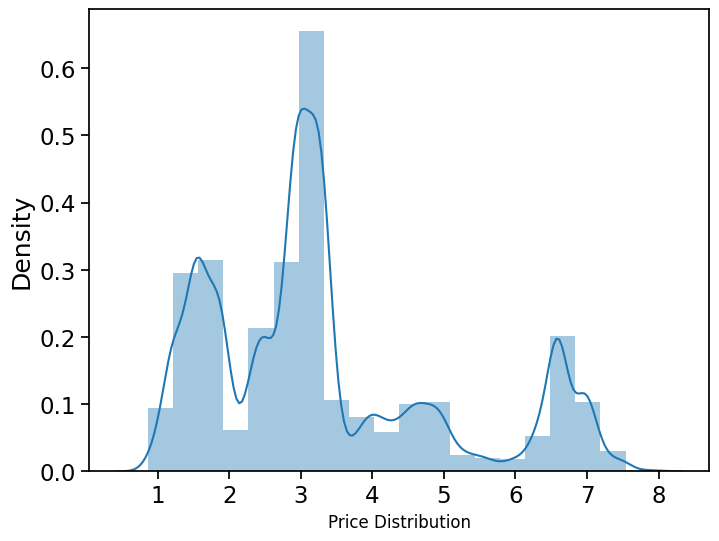

In [36]:
# distribution of Base Price variable
plt.figure(figsize=(8,6))
sns.distplot((train['BASE_PRICE'].values), bins=20, kde=True)
plt.xlabel('Price Distribution', fontsize=12)
plt.show()

- No extreme values in the base price variable
- Range for base price is 1 dollar to 8 dollars

##### FEATURE and DISPLAY

In [37]:
train[['FEATURE','DISPLAY']].isnull().sum()

,0
FEATURE,0
DISPLAY,0


In [38]:
train[['FEATURE','DISPLAY']].dtypes

,0
FEATURE,int64
DISPLAY,int64


In [39]:
train[['FEATURE','DISPLAY']].nunique()

,0
FEATURE,2
DISPLAY,2


In [40]:
train['FEATURE'].value_counts(normalize=True)

,proportion
FEATURE,
0,0.900111
1,0.099889


<Axes: xlabel='FEATURE'>

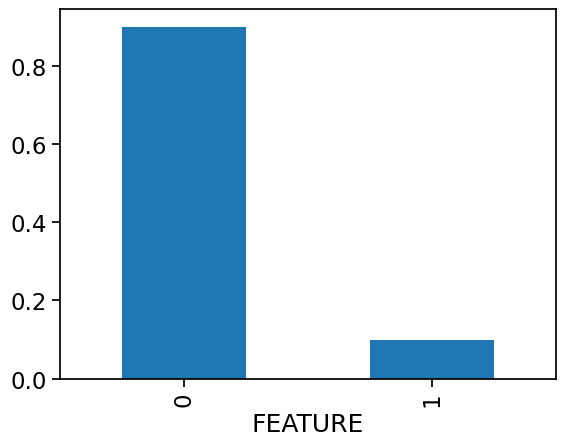

In [41]:
train['FEATURE'].value_counts(normalize=True).plot(kind='bar')

- Approximately 10 percent of product are featured

In [42]:
train['DISPLAY'].value_counts(normalize=True)

,proportion
DISPLAY,
0,0.864999
1,0.135001


<Axes: xlabel='DISPLAY'>

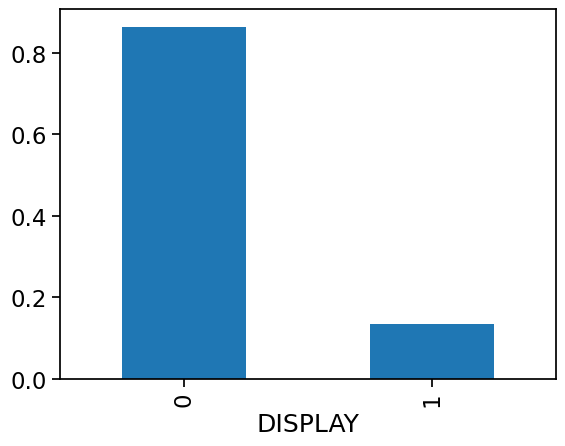

In [43]:
train['DISPLAY'].value_counts(normalize=True).plot(kind='bar')

- About 13% of products are on display

In [44]:
pd.crosstab(train['FEATURE'], train['DISPLAY']).apply(lambda r: r/len(train), axis=1)

DISPLAY,0,1
FEATURE,,
0,0.821824,0.078287
1,0.043175,0.056714


##### UNITS

In [45]:
train['UNITS'].isnull().sum()

0

In [46]:
# basic statistical details of UNITS variable
train['UNITS'].describe()

,UNITS
count,232287.000000
mean,28.063525
std,35.954341
min,0.000000
25%,9.000000
50%,18.000000
75%,34.000000
max,1800.000000


- The Range of values is very high
- Minimum number of units sold is 0 and maximum is 1800
- A huge difference between the 75th percentile and the max value indicates presence of outliers

#### How many rows in the data have 0 units sold?
#### Is there only one row with such high sales of 1800?

In [47]:
train[train['UNITS'] == 0]

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
76752,2009-12-02,28909,31254742735,NaN,4.99,0,0,0


- Only one entry with 0 items sold
- Indicates the given store does not sell the following item
- It's simply a Data Anomaly and will not be useful in model training

In [48]:
# keeping rows with UNITS sold not equal to zero
train = train[train['UNITS'] != 0]

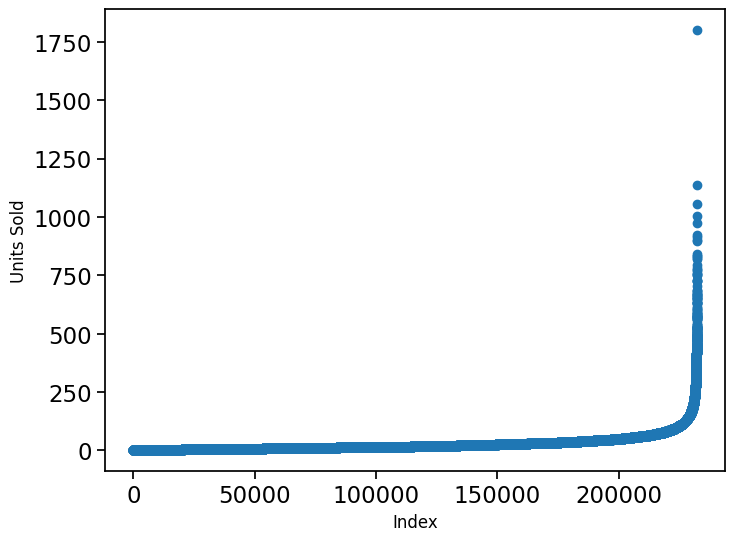

In [49]:
# scatter plot for UNITS variable
plt.figure(figsize=(8,6))
plt.scatter(x = range(train.shape[0]), y = np.sort(train['UNITS'].values))
plt.xlabel('Index', fontsize=12)
plt.ylabel('Units Sold', fontsize=12)
plt.show()

- Most of the values are less than 250
- There are a few outliers (with 1 outlier way outside the range)

In [50]:
train[train['UNITS'] > 1000]

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
7893,2009-02-11,24991,1600027527,1.67,3.19,1,0,1006
7960,2009-02-11,25027,1600027527,1.64,3.19,1,1,1800
9597,2009-02-18,25027,1600027527,1.60,3.19,0,1,1054
11209,2009-02-25,25027,1600027527,1.64,3.19,1,1,1136


To reduce the effect of outliers and for better visualization, here is a log transform of the variable


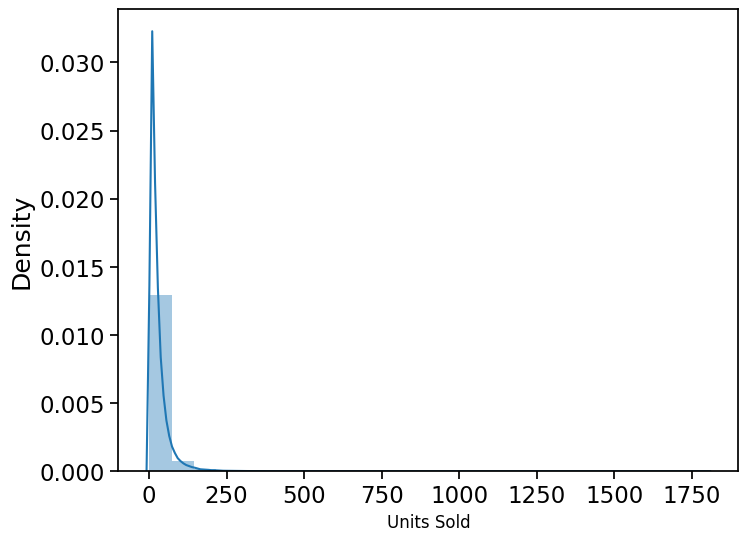

In [51]:
# distribution of UNITS variable
plt.figure(figsize=(8,6))
sns.distplot((train['UNITS'].values), bins=25, kde=True)
plt.xlabel('Units Sold', fontsize=12)
plt.show()

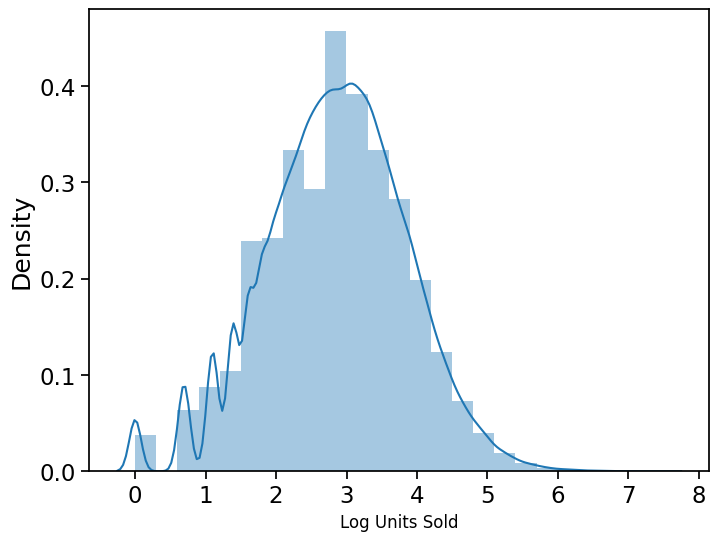

In [52]:
# log transformed UNITS column
plt.figure(figsize=(8,6))
sns.distplot(np.log(train['UNITS'].values), bins=25, kde=True)
plt.xlabel('Log Units Sold', fontsize=12)
plt.show()

- After log transformation, the distribution looks closer to a normal distribution

### Understanding Product Data

In [53]:
# first five rows of product data
product_data.head()

,UPC,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
0,1111009477,PL MINI TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
1,1111009497,PL PRETZEL STICKS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
2,1111009507,PL TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
3,1111038078,PL BL MINT ANTSPTC RINSE,PRIVATE LABEL,ORAL HYGIENE PRODUCTS,MOUTHWASHES (ANTISEPTIC),500 ML
4,1111038080,PL ANTSPTC SPG MNT MTHWS,PRIVATE LABEL,ORAL HYGIENE PRODUCTS,MOUTHWASHES (ANTISEPTIC),500 ML


In [54]:
product_data.dtypes

,0
UPC,int64
DESCRIPTION,object
MANUFACTURER,object
CATEGORY,object
SUB_CATEGORY,object
PRODUCT_SIZE,object


#### Categorical Variables

- Check the unique values for categorical variables
- Are there any missing values in the variables?
- Is there any variable with high cardinality/ sparsity?

##### UPC

In [55]:
product_data['UPC'].nunique()

30

- The number is consistent through the train and product data.
##### Are all the product codes exactly the same?

In [56]:
len(set(product_data.UPC).intersection(set(train.UPC)))

30

##### CATEGORY

In [57]:
# number and list of unique categories in the product data
product_data['CATEGORY'].nunique(), product_data['CATEGORY'].unique()

(4,
 array(['BAG SNACKS', 'ORAL HYGIENE PRODUCTS', 'COLD CEREAL',
        'FROZEN PIZZA'], dtype=object))

In [58]:
product_data['CATEGORY'].isnull().sum()

0

In [59]:
product_data['CATEGORY'].value_counts()

,count
CATEGORY,
COLD CEREAL,9
BAG SNACKS,8
FROZEN PIZZA,7
ORAL HYGIENE PRODUCTS,6


- We have four product categories -
  *  BAG SNACKS
  *  ORAL HYGIENE PRODUCTS
  *  COLD CEREAL
  *  FROZEN PIZZA

- There are 9 products with the category 'Cold Cereal'
- Similarly, 8 products labeled 'Bag snacks', 7 with category 'Frozen Pizza' and 6 'Oral Hygiene' Products

#### Is there any subdivision among the product categories?

#####  SUB_CATEGORY

In [60]:
product_data['SUB_CATEGORY'].isnull().sum()

0

In [61]:
product_data['SUB_CATEGORY'].nunique()

7

In [62]:
# displaying subcategories against each category
product_data[['CATEGORY','SUB_CATEGORY']].drop_duplicates().sort_values(by = 'CATEGORY')

,CATEGORY,SUB_CATEGORY
0,BAG SNACKS,PRETZELS
5,COLD CEREAL,ALL FAMILY CEREAL
6,COLD CEREAL,ADULT CEREAL
19,COLD CEREAL,KIDS CEREAL
8,FROZEN PIZZA,PIZZA/PREMIUM
3,ORAL HYGIENE PRODUCTS,MOUTHWASHES (ANTISEPTIC)
16,ORAL HYGIENE PRODUCTS,MOUTHWASH/RINSES AND SPRAYS


The sub-categories give additional detail about the product.

- Cereal has 3 sub categories, differentiating on the age group
- Oral hygiene products have 2 sub categories, antiseptic and rinse/spray
- Bag Snacks & Frozen Pizza have just 1 sub category, no further division


#### Does the sub category has anything to do with the size of the product?

#####  	PRODUCT_SIZE

In [63]:
# unique category, sub-category and product size combinations
product_data[['CATEGORY','SUB_CATEGORY','PRODUCT_SIZE']].drop_duplicates().sort_values(by = 'CATEGORY')

,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
0,BAG SNACKS,PRETZELS,15 OZ
14,BAG SNACKS,PRETZELS,16 OZ
25,BAG SNACKS,PRETZELS,10 OZ
6,COLD CEREAL,ADULT CEREAL,20 OZ
7,COLD CEREAL,ALL FAMILY CEREAL,18 OZ
19,COLD CEREAL,KIDS CEREAL,15 OZ
20,COLD CEREAL,KIDS CEREAL,12.2 OZ
5,COLD CEREAL,ALL FAMILY CEREAL,12.25 OZ
13,COLD CEREAL,ALL FAMILY CEREAL,12 OZ
8,FROZEN PIZZA,PIZZA/PREMIUM,32.7 OZ


The cold cereal for kids is available in two different sizes.
Also, the cold cereal for all family has the same size as the cold cereal for kids.
Hence subcategory is not an indicator of size.

**To summarize**
- Bag Snacks has 1 sub category and 3 product size available
- Oral Hygiene product has 2 sub categories and 2 size options
- Frozen Pizza has only 1 sub category and 6 different package size
- cold ceral has 3 sub categoeies, and 6 options in size

##### DESCRIPTION

In [64]:
product_data['DESCRIPTION'].isnull().sum()

0

In [65]:
# number and list of unique descriptions in the prodcut data
product_data['DESCRIPTION'].nunique(), product_data['DESCRIPTION'].unique()

(29,
 array(['PL MINI TWIST PRETZELS', 'PL PRETZEL STICKS', 'PL TWIST PRETZELS',
        'PL BL MINT ANTSPTC RINSE', 'PL ANTSPTC SPG MNT MTHWS',
        'PL HONEY NUT TOASTD OATS', 'PL RAISIN BRAN',
        'PL BT SZ FRSTD SHRD WHT', 'PL SR CRUST SUPRM PIZZA',
        'PL SR CRUST 3 MEAT PIZZA', 'PL SR CRUST PEPPRN PIZZA',
        'GM HONEY NUT CHEERIOS', 'GM CHEERIOS', 'RLDGLD TINY TWISTS PRTZL',
        'RLDGLD PRETZEL STICKS', 'SCOPE ORIG MINT MOUTHWASH',
        'CREST PH CLN MINT RINSE', 'KELL BITE SIZE MINI WHEAT',
        'KELL FROSTED FLAKES', 'KELL FROOT LOOPS', 'DIGIORNO THREE MEAT',
        'DIGRN SUPREME PIZZA', 'DIGRN PEPP PIZZA',
        'FRSC BRCK OVN ITL PEP PZ', 'SNYDR PRETZEL RODS',
        'SNYDR SOURDOUGH NIBBLERS', 'SNYDR FF MINI PRETZELS',
        'LSTRNE CL MINT ANTSPTC MW', 'LSTRNE FRS BRST ANTSPC MW'],
       dtype=object))

- We have 29 descriptions in the dataset, for 30 products.
- Almost all products have a unique description.

In [66]:
(product_data['DESCRIPTION'].value_counts())

,count
DESCRIPTION,
GM CHEERIOS,2
PL MINI TWIST PRETZELS,1
SCOPE ORIG MINT MOUTHWASH,1
LSTRNE CL MINT ANTSPTC MW,1
SNYDR FF MINI PRETZELS,1
SNYDR SOURDOUGH NIBBLERS,1
SNYDR PRETZEL RODS,1
FRSC BRCK OVN ITL PEP PZ,1
DIGRN PEPP PIZZA,1


In [67]:
product_data.loc[product_data['DESCRIPTION']=='GM CHEERIOS']

,UPC,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
12,1600027528,GM CHEERIOS,GENERAL MI,COLD CEREAL,ALL FAMILY CEREAL,18 OZ
13,1600027564,GM CHEERIOS,GENERAL MI,COLD CEREAL,ALL FAMILY CEREAL,12 OZ


In [68]:
product_data.loc[product_data['UPC'] == 1600027527]

,UPC,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
11,1600027527,GM HONEY NUT CHEERIOS,GENERAL MI,COLD CEREAL,ALL FAMILY CEREAL,12.25 OZ


- More granular description for the product
- Includes the type of product and manufacturer

##### MANUFACTURER


#### How many Manufacturers/ suppliers are we associated with?

#### Are same products created by multiple manufacturers?


In [69]:
product_data['MANUFACTURER'].isnull().sum()

0

In [70]:
product_data['MANUFACTURER'].nunique()

9

In [71]:
# displaying the list of manufacturers against the 4 categories
temp = product_data[['CATEGORY','MANUFACTURER']].drop_duplicates()
pd.crosstab([temp['CATEGORY']], temp['MANUFACTURER'])

MANUFACTURER,FRITO LAY,GENERAL MI,KELLOGG,P & G,PRIVATE LABEL,SNYDER S,TOMBSTONE,TONYS,WARNER
CATEGORY,,,,,,,,,
BAG SNACKS,1,0,0,0,1,1,0,0,0
COLD CEREAL,0,1,1,0,1,0,0,0,0
FROZEN PIZZA,0,0,0,0,1,0,1,1,0
ORAL HYGIENE PRODUCTS,0,0,0,1,1,0,0,0,1


- We have 4 unique categories of Products
- Each category has three manufacturers
- Every category has a manufacturer 'private label' (and 2 other manufacturers)

### Understanding Store Data

In [72]:
store_data.head()

,STORE_ID,STORE_NAME,ADDRESS_CITY_NAME,ADDRESS_STATE_PROV_CODE,MSA_CODE,SEG_VALUE_NAME,PARKING_SPACE_QTY,SALES_AREA_SIZE_NUM,AVG_WEEKLY_BASKETS
0,367,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707
1,389,SILVERLAKE,ERLANGER,KY,17140,MAINSTREAM,408.0,46073,24767
2,613,EAST ALLEN,ALLEN,TX,19100,MAINSTREAM,464.0,64926,29386
3,623,HOUSTON,HOUSTON,TX,26420,MAINSTREAM,NaN,46930,36741
4,2277,ANDERSON TOWNE CTR,CINCINNATI,OH,17140,UPSCALE,NaN,81958,54053


In [73]:
store_data.dtypes

,0
STORE_ID,int64
STORE_NAME,object
ADDRESS_CITY_NAME,object
ADDRESS_STATE_PROV_CODE,object
MSA_CODE,int64
SEG_VALUE_NAME,object
PARKING_SPACE_QTY,float64
SALES_AREA_SIZE_NUM,int64
AVG_WEEKLY_BASKETS,int64


#### Numerical Variables

- Check the distribution of numerical variables
- Are there any extreme values?
- Are there any missing values in the variables?

#### Categorical Variables

- Check the unique values for categorical variables
- Are there any missing values in the variables?
- Is there any variable with high cardinality/ sparsity?

##### STORE_ID

In [74]:
store_data['STORE_ID'].nunique()

76

In [75]:
len(set(store_data.STORE_ID).intersection(set(train.STORE_NUM)))

76

##### STORE_NAME

In [76]:
store_data['STORE_NAME'].isnull().sum()

0

In [77]:
store_data['STORE_NAME'].nunique()

72

- The number of unique store IDs is more than number of unique store names
- There might be stores with same name, located in different city

#### Which store name is being repeated?

#### Why do some stores have same name and different ID?

In [78]:
# number of store names repeating
store_data['STORE_NAME'].value_counts()

,count
STORE_NAME,
HOUSTON,4
MIDDLETOWN,2
15TH & MADISON,1
DUNCANVILLE,1
WOOD FOREST S/C,1
...,...
AT EASTEX FRWY,1
DENT,1
THE WOODLANDS,1


In [79]:
store_data.loc[store_data['STORE_NAME'] == 'HOUSTON']

,STORE_ID,STORE_NAME,ADDRESS_CITY_NAME,ADDRESS_STATE_PROV_CODE,MSA_CODE,SEG_VALUE_NAME,PARKING_SPACE_QTY,SALES_AREA_SIZE_NUM,AVG_WEEKLY_BASKETS
3,623,HOUSTON,HOUSTON,TX,26420,MAINSTREAM,NaN,46930,36741
9,2513,HOUSTON,HOUSTON,TX,26420,UPSCALE,NaN,61833,32423
54,21485,HOUSTON,KATY,TX,26420,MAINSTREAM,NaN,46369,26472
59,23327,HOUSTON,HOUSTON,TX,26420,MAINSTREAM,NaN,50722,30258


In [80]:
store_data.loc[store_data['STORE_NAME'] == 'MIDDLETOWN']

,STORE_ID,STORE_NAME,ADDRESS_CITY_NAME,ADDRESS_STATE_PROV_CODE,MSA_CODE,SEG_VALUE_NAME,PARKING_SPACE_QTY,SALES_AREA_SIZE_NUM,AVG_WEEKLY_BASKETS
50,21221,MIDDLETOWN,MIDDLETOWN,OH,17140,VALUE,NaN,48128,17010
74,28909,MIDDLETOWN,MIDDLETOWN,OH,17140,MAINSTREAM,NaN,85876,28986


The store names that are repeated, are actually different stores which either have a different city or different segment (upscale, mainstream, value) or  location. Hence they are given a different IDs.

##### ADDRESS_CITY_NAME  and ADDRESS_STATE_PROV_CODE

In [81]:
store_data[['ADDRESS_STATE_PROV_CODE', 'ADDRESS_CITY_NAME']].isnull().sum()

,0
ADDRESS_STATE_PROV_CODE,0
ADDRESS_CITY_NAME,0


#### How many cities and states are the stores located in?

In [82]:
store_data[['ADDRESS_STATE_PROV_CODE', 'ADDRESS_CITY_NAME']].nunique()

,0
ADDRESS_STATE_PROV_CODE,4
ADDRESS_CITY_NAME,51


Let's find out the number of stores in each of the state

In [83]:
store_data.groupby(['ADDRESS_STATE_PROV_CODE'])['STORE_ID'].count()

,STORE_ID
ADDRESS_STATE_PROV_CODE,
IN,1
KY,4
OH,30
TX,41


- Each store has a unique store ID
- Most stores are from Ohio and Texas ~93%
- Few from Kentucky and Indiana ~7%

In [84]:
store_data.groupby(['ADDRESS_STATE_PROV_CODE'])['ADDRESS_CITY_NAME'].nunique()

,ADDRESS_CITY_NAME
ADDRESS_STATE_PROV_CODE,
IN,1
KY,3
OH,16
TX,31


In [85]:
store_data['ADDRESS_CITY_NAME'].value_counts()

,count
ADDRESS_CITY_NAME,
CINCINNATI,9
HOUSTON,8
MIDDLETOWN,3
COVINGTON,2
SUGAR LAND,2
LOVELAND,2
MAINEVILLE,2
HAMILTON,2
KATY,2


##### MSA_CODE

In [86]:
store_data['MSA_CODE'].isnull().sum()

0

In [87]:
store_data['MSA_CODE'].nunique(), store_data['MSA_CODE'].unique()

(9, array([17140, 19100, 26420, 17780, 47540, 43300, 19380, 13140, 44220]))

In [88]:
store_data['MSA_CODE'].value_counts()

,count
MSA_CODE,
17140,29
26420,21
19100,17
19380,4
17780,1
47540,1
43300,1
13140,1
44220,1


In [89]:
(store_data.groupby(['MSA_CODE', 'ADDRESS_STATE_PROV_CODE'])['STORE_ID'].count())

MSA_CODE  ADDRESS_STATE_PROV_CODE
13140     TX                          1
17140     IN                          1
          KY                          4
          OH                         24
17780     TX                          1
19100     TX                         17
19380     OH                          4
26420     TX                         21
43300     TX                          1
44220     OH                          1
47540     OH                          1
Name: STORE_ID, dtype: int64

- These codes are assigned based on the geographical location and population density.
- 17140 is present in all three except Texas (which has a different geographical region)

##### PARKING_SPACE_QTY  and SALES_AREA_SIZE_NUM

In [90]:
store_data[['PARKING_SPACE_QTY', 'SALES_AREA_SIZE_NUM']].isnull().sum()

,0
PARKING_SPACE_QTY,51
SALES_AREA_SIZE_NUM,0


- Of 76 stores, parking area of 51 is missing

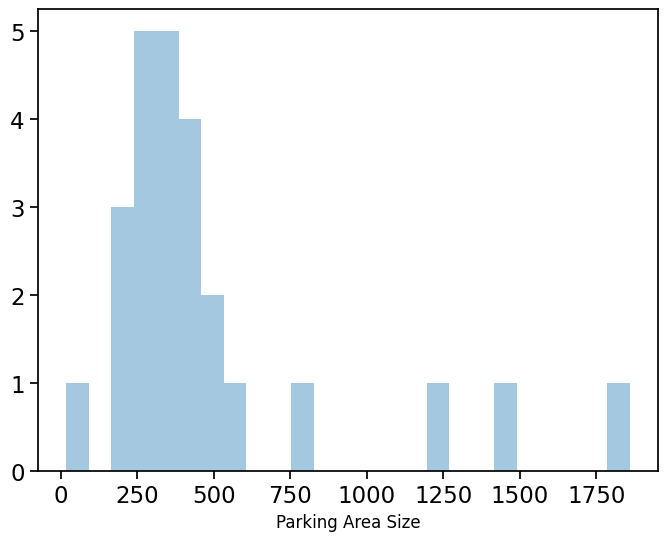

In [91]:
plt.figure(figsize=(8,6))
sns.distplot(store_data['PARKING_SPACE_QTY'], bins=25, kde=False)
plt.xlabel('Parking Area Size', fontsize=12)
plt.show()

- About 15 stores have parking area between 250 - 500 units

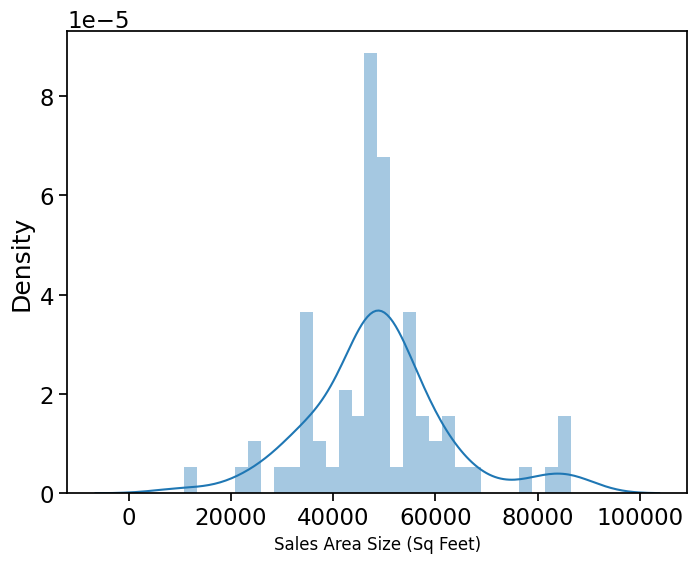

In [92]:
plt.figure(figsize=(8,6))
sns.distplot(store_data['SALES_AREA_SIZE_NUM'], bins=30, kde=True)
plt.xlabel('Sales Area Size (Sq Feet)', fontsize=12)
plt.show()

- Most stores have the area between 30-70 K
- Only a small number of stores have area less than 30k or greater than 90k

#### How is Average store size varying for different states?

In [93]:
(store_data.groupby(['ADDRESS_STATE_PROV_CODE'])['SALES_AREA_SIZE_NUM'].mean()).sort_values(ascending=False)

,SALES_AREA_SIZE_NUM
ADDRESS_STATE_PROV_CODE,
IN,58563.000000
OH,52691.200000
TX,46920.902439
KY,39855.500000


<Axes: xlabel='SALES_AREA_SIZE_NUM', ylabel='Density'>

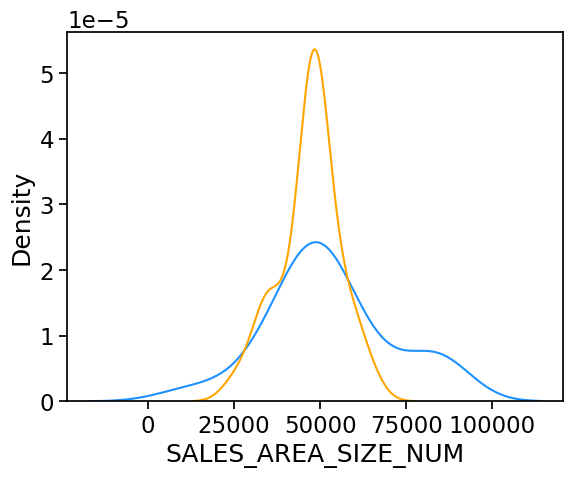

In [94]:
state_oh = store_data.loc[store_data['ADDRESS_STATE_PROV_CODE'] == 'OH']
state_tx = store_data.loc[store_data['ADDRESS_STATE_PROV_CODE'] == 'TX']

sns.distplot(state_oh['SALES_AREA_SIZE_NUM'], hist=False,color= 'dodgerblue', label= 'OHIO')
sns.distplot(state_tx['SALES_AREA_SIZE_NUM'], hist=False,  color= 'orange', label= 'TEXAS')


- Indiana has only one store and the area size is 58,563 sq feet.
- Ohio and Texas have average around 52k and 50k.
- Ohio has stores distributed at all sizes.
- Texas mainly has stores between sales area 30k to 60k

##### AVG_WEEKLY_BASKETS

In [95]:
store_data['AVG_WEEKLY_BASKETS'].isnull().sum()

0

In [96]:
store_data['AVG_WEEKLY_BASKETS'].describe()

,AVG_WEEKLY_BASKETS
count,76.000000
mean,24226.921053
std,8863.939362
min,10435.000000
25%,16983.500000
50%,24667.500000
75%,29398.500000
max,54053.000000


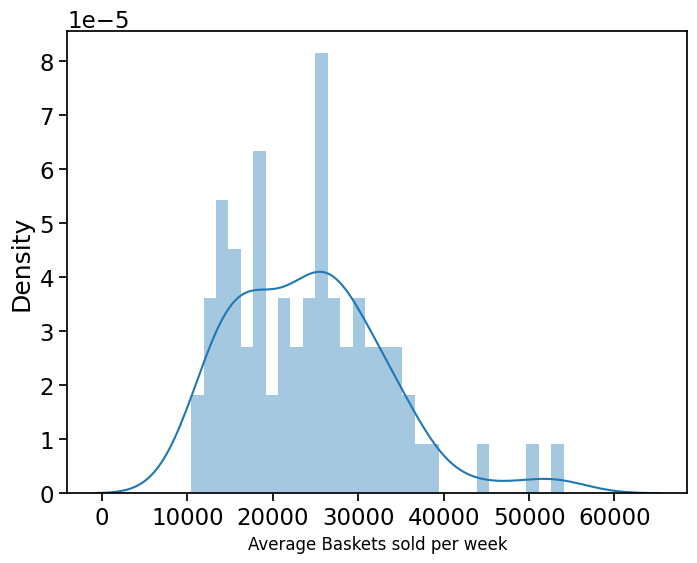

In [97]:
plt.figure(figsize=(8,6))
sns.distplot(store_data['AVG_WEEKLY_BASKETS'], bins=30, kde=True)
plt.xlabel('Average Baskets sold per week', fontsize=12)
plt.show()

#### What are the average weekly baskets sold for the states?

In [98]:
(store_data.groupby(['ADDRESS_STATE_PROV_CODE'])['AVG_WEEKLY_BASKETS'].mean()).sort_values(ascending=False)

,AVG_WEEKLY_BASKETS
ADDRESS_STATE_PROV_CODE,
OH,26113.766667
TX,23234.195122
KY,21489.000000
IN,19275.000000


##### SEG_VALUE_NAME

In [99]:
store_data['SEG_VALUE_NAME'].isnull().sum()

0

There are certain segments assigned to store, based on the brand and quality of products sold at the store.

- **Upscale stores** : Located in high income neighborhoods and offer more high-end product
- **Mainstream stores** : Located in middle class areas, offering a mix of upscale and value product
- **Value stores** : Focus on low prices products targeting low income customers

Let us look at the distribution of stores in each of these segments

In [100]:
store_data['SEG_VALUE_NAME'].value_counts()

,count
SEG_VALUE_NAME,
MAINSTREAM,43
VALUE,19
UPSCALE,14


#### Does the segment has any relation with the store area?

#### Is there a difference in the average sales for each segment?

In [101]:
(store_data.groupby(['SEG_VALUE_NAME'])['SALES_AREA_SIZE_NUM'].mean()).sort_values(ascending=False)

,SALES_AREA_SIZE_NUM
SEG_VALUE_NAME,
UPSCALE,59556.428571
MAINSTREAM,50075.976744
VALUE,38706.368421


In [102]:
(store_data.groupby(['SEG_VALUE_NAME'])['AVG_WEEKLY_BASKETS'].mean()).sort_values(ascending=False)

,AVG_WEEKLY_BASKETS
SEG_VALUE_NAME,
UPSCALE,28735.928571
MAINSTREAM,24024.093023
VALUE,21363.526316


# 4. Data Exploration - Train, Product, Store

## Validating the Hypothesis

During the Hypothesis Generation, we listed down the following hypothesis.

**Product Data**
- Product type/ Category : Different Product Categories can have significantly varying trends/patterns
- Product Size : Larger products should be more in demand
- Price of Product: Same category products with lower price would have more sales
- Company/ Manufacturer: Well known brands/manufacturers will have higher sales

**Train Data**

- Offer Applicable: Featured Products with attractive offers will have higher sales
- Product Promotion: Sales will be more for products with in-store promotion

**Store Data**
- Store Location: Stores in a particular state/city will have a similar trend
- Size of Store: Stores with larger area would have more sales
- Average Wait time: If average baskets sold is higher, wait time would be low. Implies higher sale of units.

### Merging the Store and Product Datasets

In [103]:
store_product_data = train.merge(product_data, how = 'left', on='UPC')

store_product_data = store_product_data.merge(store_data, how = 'left', left_on = 'STORE_NUM', right_on = 'STORE_ID')

In [104]:
store_product_data.shape

(232286, 22)

In [105]:
store_product_data.columns

Index(['WEEK_END_DATE', 'STORE_NUM', 'UPC', 'PRICE', 'BASE_PRICE', 'FEATURE',
       'DISPLAY', 'UNITS', 'DESCRIPTION', 'MANUFACTURER', 'CATEGORY',
       'SUB_CATEGORY', 'PRODUCT_SIZE', 'STORE_ID', 'STORE_NAME',
       'ADDRESS_CITY_NAME', 'ADDRESS_STATE_PROV_CODE', 'MSA_CODE',
       'SEG_VALUE_NAME', 'PARKING_SPACE_QTY', 'SALES_AREA_SIZE_NUM',
       'AVG_WEEKLY_BASKETS'],
      dtype='object')

### Trend or Seasonal Pattern in Product Sales

- Product type/Category: Different Product Categories can have significantly varying trends/patterns


### Units sold per week

<Axes: xlabel='WEEK_END_DATE', ylabel='UNITS'>

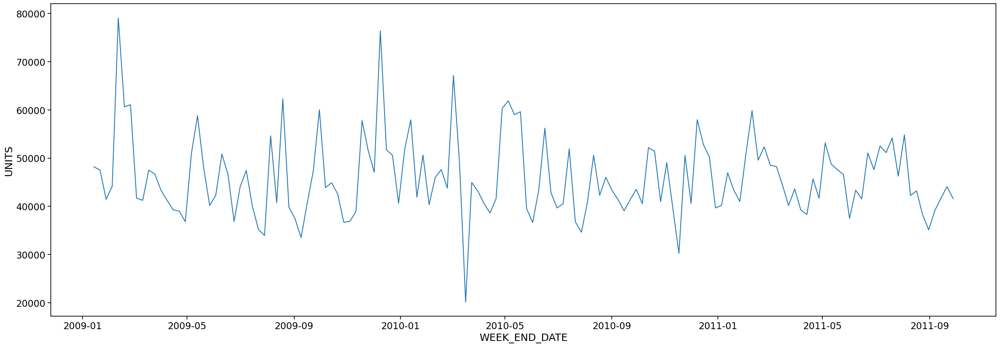

In [106]:
#sum of units sold per week
weekly_demand = store_product_data.groupby(['WEEK_END_DATE'])['UNITS'].sum()

plt.figure(figsize=(30,10))
sns.lineplot(x = weekly_demand.index, y = weekly_demand)

- Displays the total number of units sold by the retailer (including all products and from all stores)
- The highest number is close to 80,000 and lowest is close to 20,000 units
- There is no evident pattern or trend in the plot
- The spikes can be seen in either direction and at no constant interval

### Units sold per week - at product level

Now, we will look at category wise sales or demand patterns to see if there is any similarity within each category

In [107]:
# function to plot weekly sales of products
def product_plots(product_list):

    # dictionary storing UPC and weekly sales
    d = {product: store_product_data[store_product_data['UPC'] == product].groupby(['WEEK_END_DATE'])['UNITS'].sum() for product in product_list}
    fig, axs = plt.subplots(len(product_list), 1, figsize = (20, 20), dpi=300)
    j = 0

    for product in d.keys():
        # adding manufacturer and descritption in title
        manu = product_data[product_data['UPC'] == product]['MANUFACTURER'].values[0]
        desc = product_data[product_data['UPC'] == product]['DESCRIPTION'].values[0]
        # creating the plot
        sns.lineplot(x = d[product].index, y = d[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        j = j+1
    plt.tight_layout()

In [108]:
# creating list of products based on category
pretzels = list(product_data[product_data['CATEGORY'] == 'BAG SNACKS']['UPC'])
frozen_pizza = list(product_data[product_data['CATEGORY'] == 'FROZEN PIZZA']['UPC'])
oral_hygiene = list(product_data[product_data['CATEGORY'] == 'ORAL HYGIENE PRODUCTS']['UPC'])
cold_cereal = list(product_data[product_data['CATEGORY'] == 'COLD CEREAL']['UPC'])

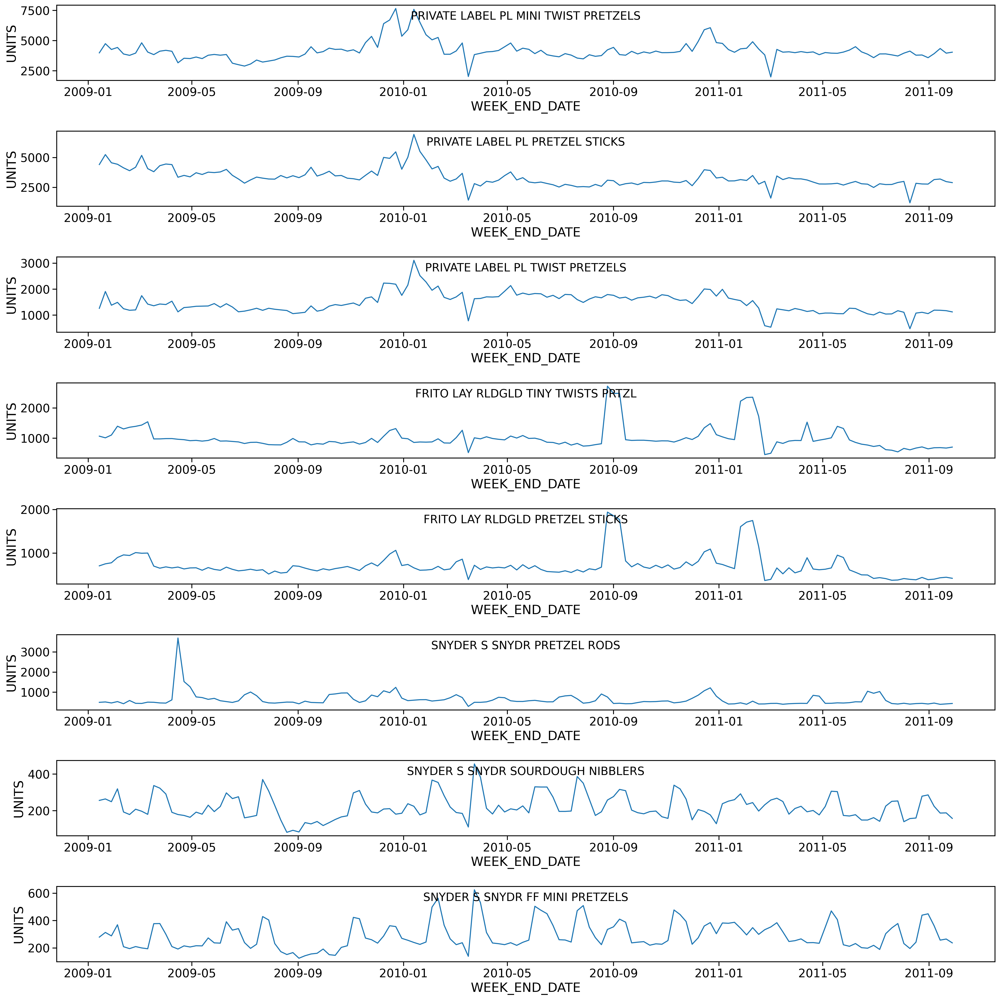

In [109]:
product_plots(pretzels)

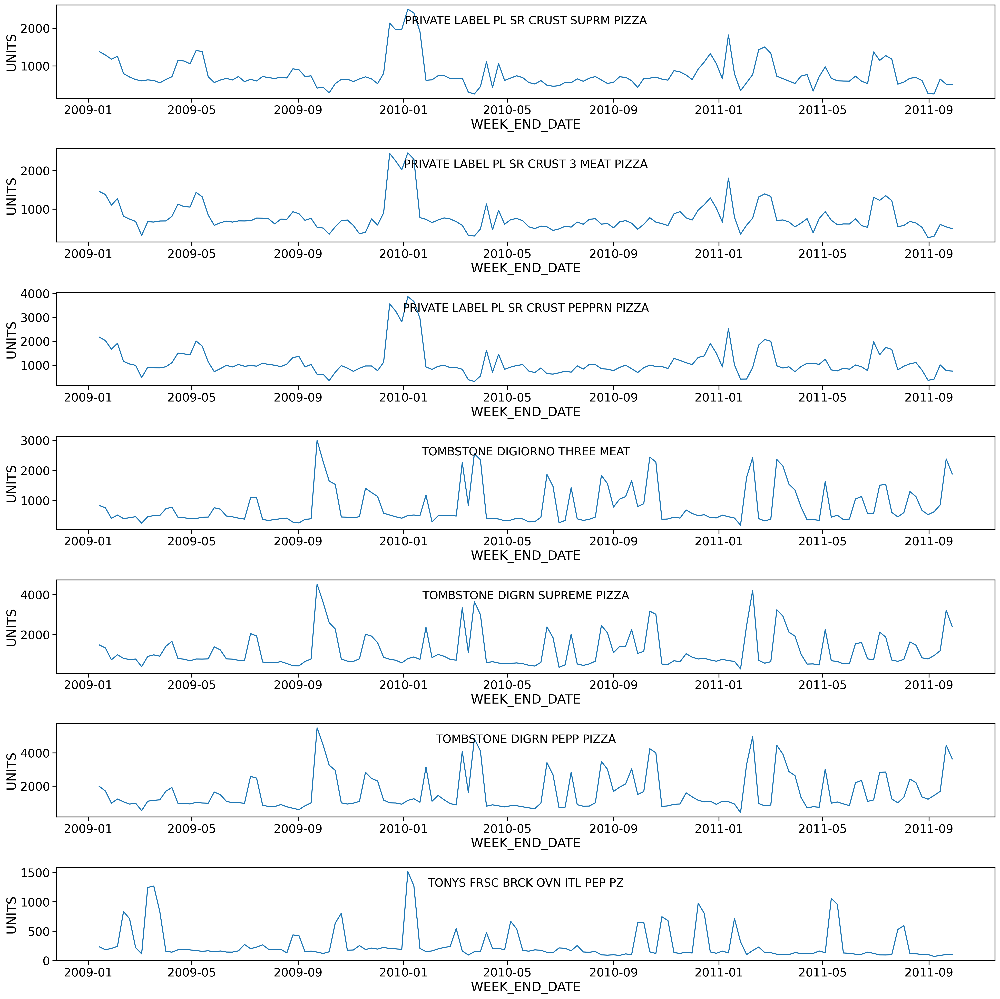

In [110]:
product_plots(frozen_pizza)

- No increasing/decreasing trend for the sale of products over time
- No seasonal patterns seen on individual product sale
- Products by same manufaturer have similar patterns (spikes and drops).


### Units sold per week - at store level
Now, let us look store level demand patterns to see if there are any patterns here.

In [111]:
# Randomly selecting 5 store ID
stores_plot = random.sample(list(store_data['STORE_ID']), 5)

In [112]:
#creating dictionary with store number as keys
# for each store, calculate sum of units sold per week
d = {store: train[train['STORE_NUM'] == store].groupby(['WEEK_END_DATE'])['UNITS'].sum() for store in stores_plot}

<Figure size 3000x1000 with 0 Axes>

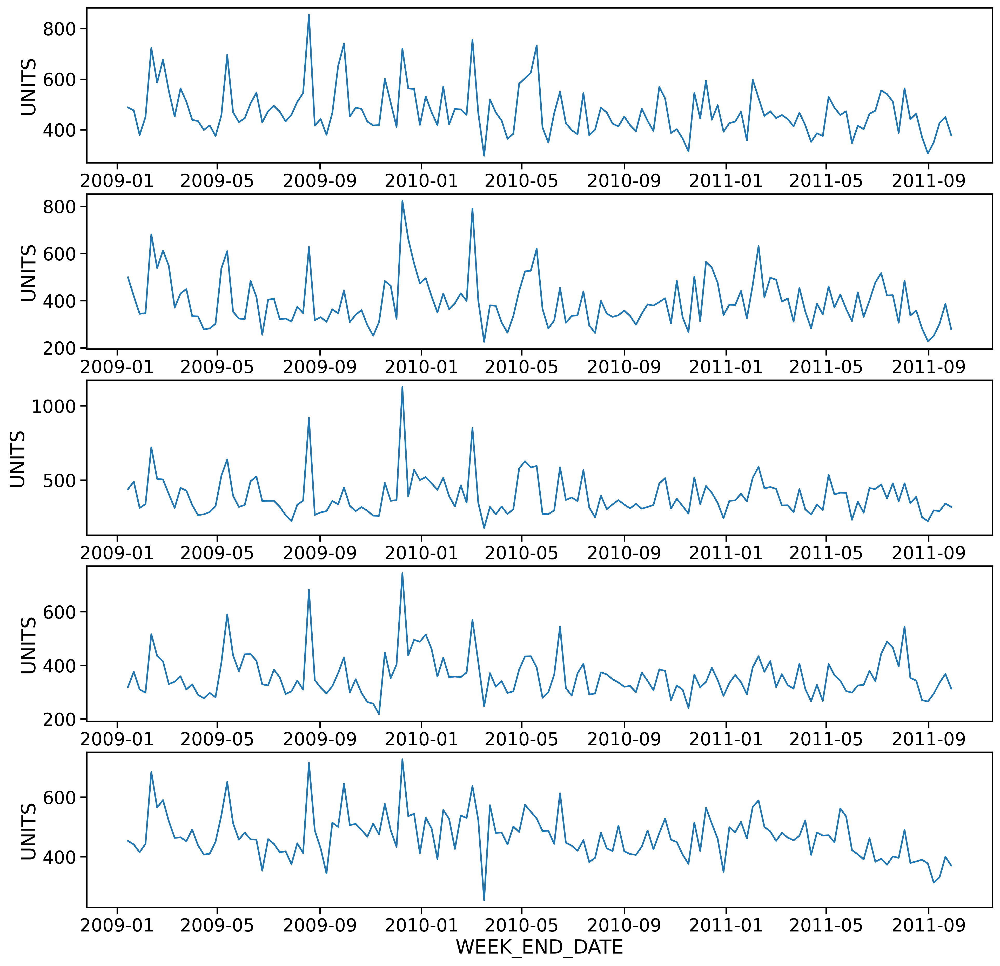

In [113]:
plt.figure(figsize=(30,10))

fig, axs = plt.subplots(5, 1, figsize = (15, 15), dpi=300)
j = 0
for store in d.keys():
    sns.lineplot(x = d[store].index, y = d[store],ax = axs[j])
    j = j+1

For the randomly selected store numbers, we can see that there is no pattern in the plot. The same was repeated for a number of stores and the data showed no increasing or decreasing trend or seasonality.

#### Are the sudden increase in sales due to product/in-store promotion?

### Featured or Displayed Product have higher sale

- Offer Applicable: Featured Products with attractive offers will have higher sales
- Product Promotion: Sales will be more for products with in-store promotion

In [114]:
def featured_plots(product_list):
    #dictionary storing UPC and 'Featured' variable
    d_f = {product: 1000*train[train['UPC'] == product].groupby(['WEEK_END_DATE'])['FEATURE'].mean() for product in product_list}
    #dictionary storing UPC and Product Sales
    d = {product: train[train['UPC'] == product].groupby(['WEEK_END_DATE'])['UNITS'].sum() for product in product_list}


    fig, axs = plt.subplots(len(product_list), 1, figsize = (20, 20), dpi=300)
    j = 0
    for product in d.keys():
        # Manufacturer name and Descritption in title
        manu = product_data[product_data['UPC'] == product]['MANUFACTURER'].values[0]
        desc = product_data[product_data['UPC'] == product]['DESCRIPTION'].values[0]

        # plotting featured and sales values
        sns.lineplot(x = d_f[product].index, y = d_f[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        sns.lineplot(x = d[product].index, y = d[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        j = j+1

In [115]:
product_list_f = list(product_data[product_data['CATEGORY'] == 'BAG SNACKS']['UPC'])

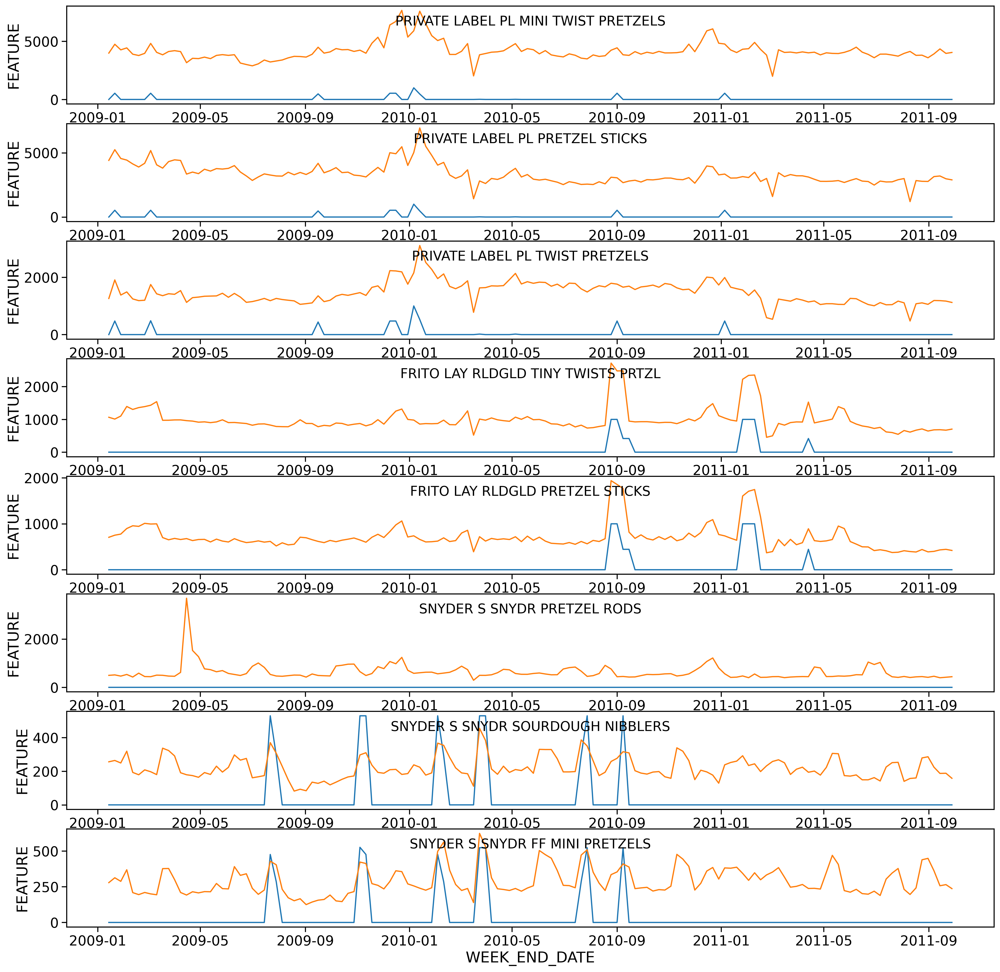

In [116]:
featured_plots(product_list_f)

- When the products are featured, the sales increase.

#### Does the in-store display also have a similar effect?

In [117]:
def display_plots(product_list):
    d_d = {product: 1000*train[train['UPC'] == product].groupby(['WEEK_END_DATE'])['DISPLAY'].mean() for product in product_list}
    d = {product: train[train['UPC'] == product].groupby(['WEEK_END_DATE'])['UNITS'].sum() for product in product_list}
    fig, axs = plt.subplots(len(product_list), 1, figsize = (20, 20), dpi=300)
    j = 0
    for product in d.keys():
        manu = product_data[product_data['UPC'] == product]['MANUFACTURER'].values[0]
        desc = product_data[product_data['UPC'] == product]['DESCRIPTION'].values[0]
        sns.lineplot(x = d[product].index, y = d[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        sns.lineplot(x = d_d[product].index, y = d_d[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        j = j+1

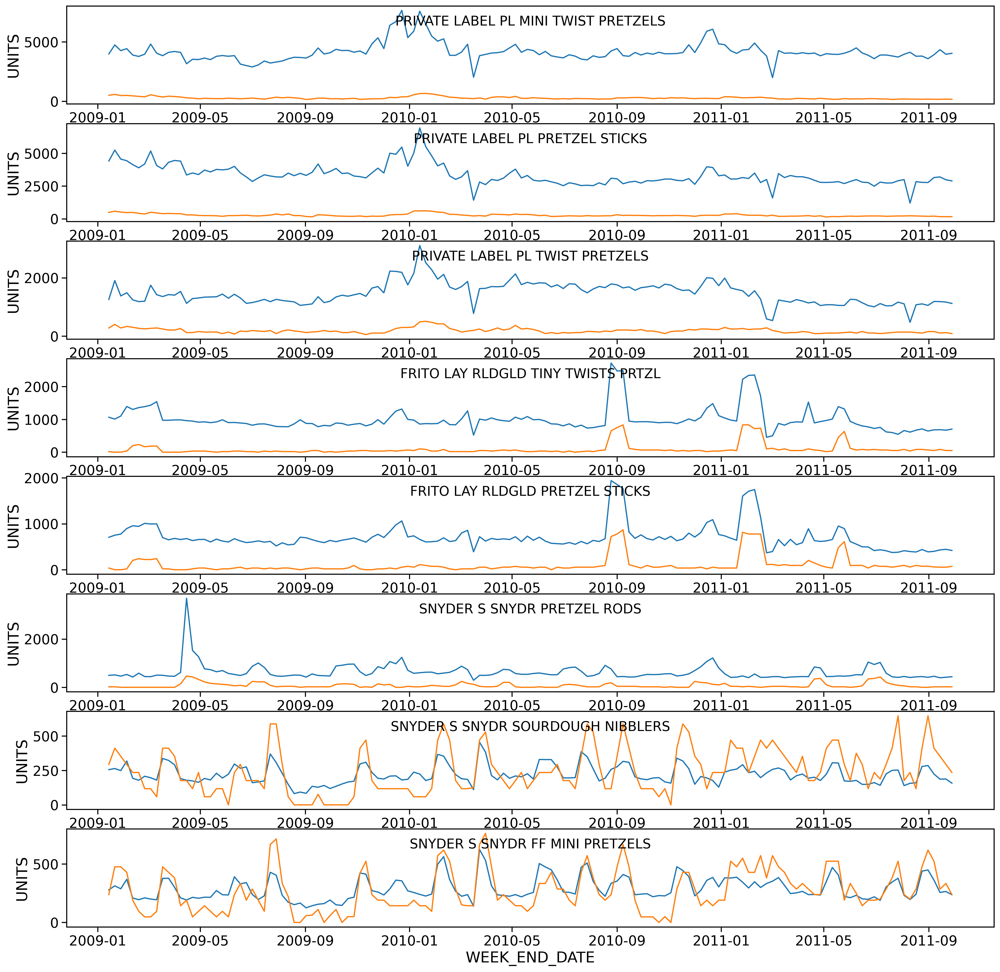

In [118]:
display_plots(product_list_f)

- It is evident that product sales are greatly affected by the display.
- For products on display, the sales are higher.

### Product sales higher for lower priced items

- Price of Product: Same category products with lower price would have more sales


In [119]:
product_size_coldcereal = store_product_data.loc[store_product_data['CATEGORY']=='COLD CEREAL']
product_size_bagsnacks  = store_product_data.loc[store_product_data['CATEGORY']=='BAG SNACKS']
product_size_frozenpizza = store_product_data.loc[store_product_data['CATEGORY']=='FROZEN PIZZA']
product_size_oralhyiegne = store_product_data.loc[store_product_data['CATEGORY']=='ORAL HYGIENE PRODUCTS']

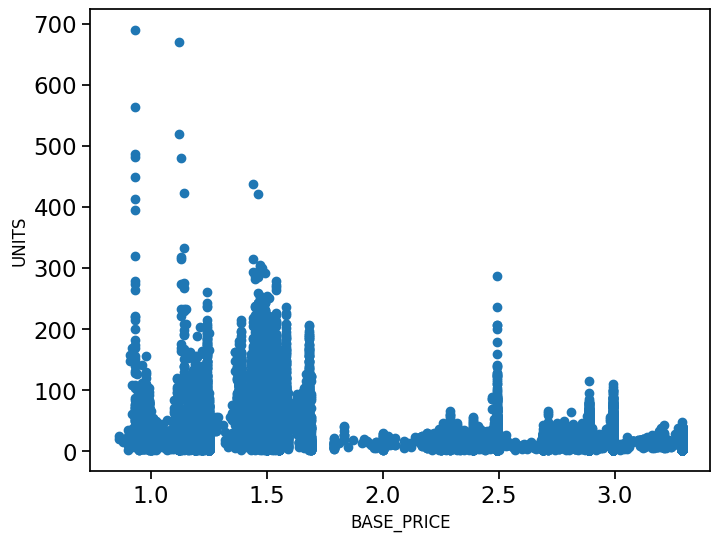

In [120]:
# scatter plot for base price and sales
plt.figure(figsize=(8,6))
plt.scatter(x = (product_size_bagsnacks['BASE_PRICE']), y = (product_size_bagsnacks['UNITS']))
plt.xlabel('BASE_PRICE', fontsize=12)
plt.ylabel('UNITS', fontsize=12)
plt.show()

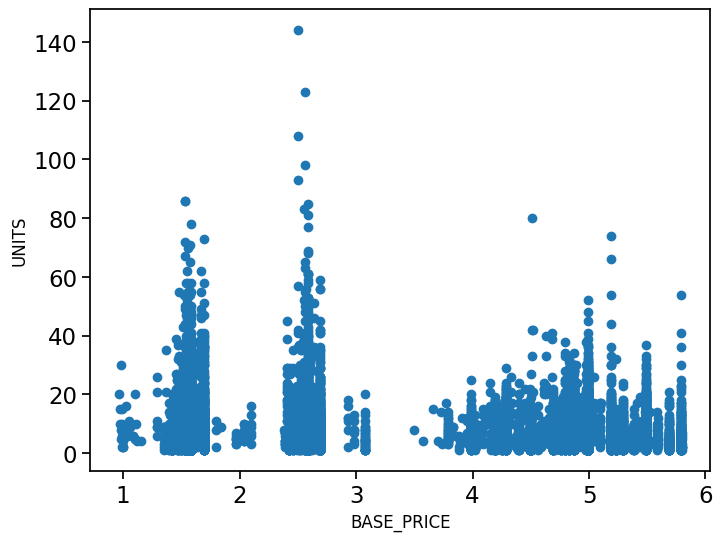

In [121]:
# scatter plot for base price and sales
plt.figure(figsize=(8,6))
plt.scatter(x = (product_size_oralhyiegne['BASE_PRICE']), y = (product_size_oralhyiegne['UNITS']))
plt.xlabel('BASE_PRICE', fontsize=12)
plt.ylabel('UNITS', fontsize=12)
plt.show()

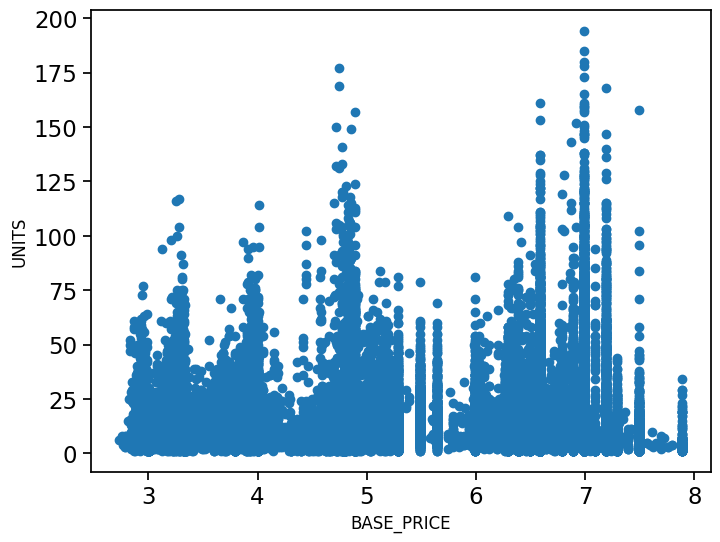

In [122]:
# scatter plot for base price and sales
plt.figure(figsize=(8,6))
plt.scatter(x = (product_size_frozenpizza['BASE_PRICE']), y = (product_size_frozenpizza['UNITS']))
plt.xlabel('BASE_PRICE', fontsize=12)
plt.ylabel('UNITS', fontsize=12)
plt.show()

- For bag snacks and oral hygiene category, items with lower price show a higher sale.
- Frozen pizza items have higher sale for higher price items.

Check the pattern for cold cereal at your end.

## Product size versus Product Sales

- Product Size : Larger products should be more in demand


In [123]:
pd.crosstab(product_size_coldcereal['CATEGORY'], product_size_coldcereal['PRODUCT_SIZE'])

PRODUCT_SIZE,12 OZ,12.2 OZ,12.25 OZ,15 OZ,18 OZ,20 OZ
CATEGORY,,,,,,
COLD CEREAL,10786,10766,21426,10785,32203,10789


In [124]:
pd.crosstab(product_size_bagsnacks['CATEGORY'], product_size_bagsnacks['PRODUCT_SIZE'])

PRODUCT_SIZE,10 OZ,15 OZ,16 OZ
CATEGORY,,,
BAG SNACKS,6916,28921,21443


#### Is the product sale higher for a particular brand or manufacturer?

## Product sales for different manufacturers

- Company/ Manufacturer: Well known brands/manufacturers will have higher sales


In [125]:
pretzels = list(product_data[product_data['CATEGORY'] == 'BAG SNACKS']['UPC'])
frozen_pizza = list(product_data[product_data['CATEGORY'] == 'FROZEN PIZZA']['UPC'])
oral_hygiene = list(product_data[product_data['CATEGORY'] == 'ORAL HYGIENE PRODUCTS']['UPC'])
cold_cereal = list(product_data[product_data['CATEGORY'] == 'COLD CEREAL']['UPC'])

,UPC,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
0,1111009477,PL MINI TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
1,1111009497,PL PRETZEL STICKS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
2,1111009507,PL TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
14,2840004768,RLDGLD TINY TWISTS PRTZL,FRITO LAY,BAG SNACKS,PRETZELS,16 OZ
15,2840004770,RLDGLD PRETZEL STICKS,FRITO LAY,BAG SNACKS,PRETZELS,16 OZ
25,7797502248,SNYDR PRETZEL RODS,SNYDER S,BAG SNACKS,PRETZELS,10 OZ
26,7797508004,SNYDR SOURDOUGH NIBBLERS,SNYDER S,BAG SNACKS,PRETZELS,16 OZ
27,7797508006,SNYDR FF MINI PRETZELS,SNYDER S,BAG SNACKS,PRETZELS,16 OZ


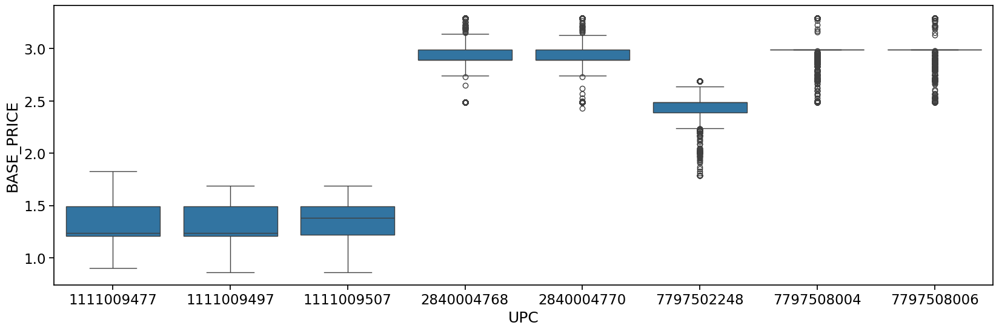

In [126]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="UPC", y="BASE_PRICE", data=train[train['UPC'].isin(pretzels)])
product_data[product_data['UPC'].isin(pretzels)]

- All Private Label snacks have lower price.
- The Snyder S bag snacks with a smaller size has a lower price.

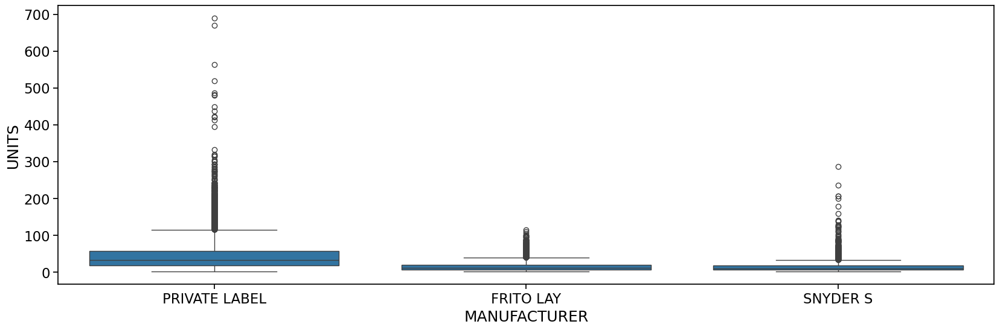

In [127]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=store_product_data[store_product_data['UPC'].isin(pretzels)])

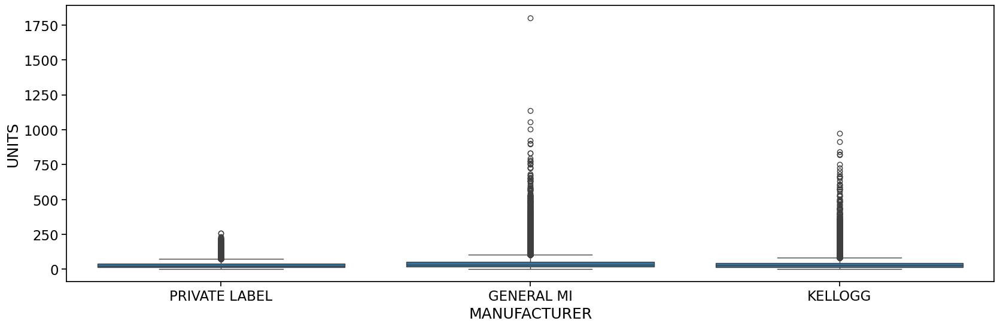

In [128]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=store_product_data[store_product_data['UPC'].isin(cold_cereal)])

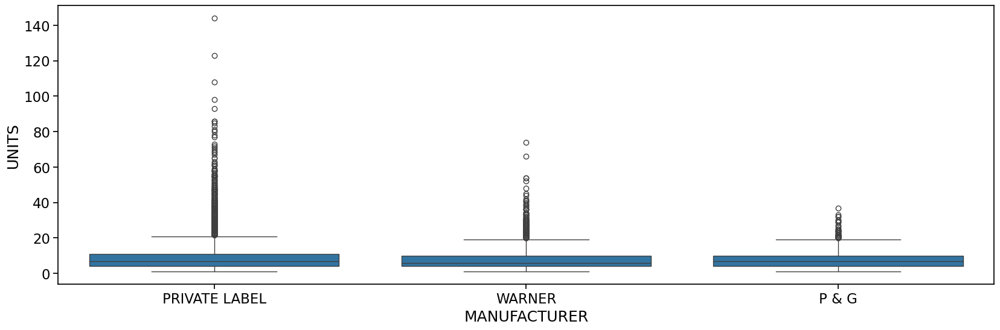

In [129]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=store_product_data[store_product_data['UPC'].isin(oral_hygiene)])

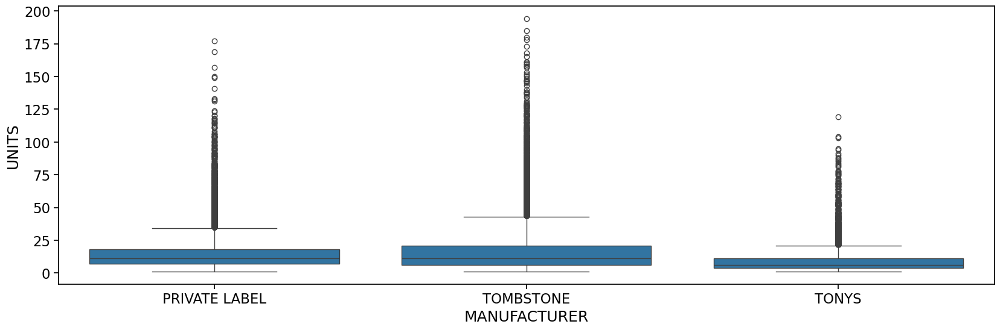

In [130]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=store_product_data[store_product_data['UPC'].isin(frozen_pizza)])

#### Is there a significant difference in the product sales for different regions?

#### How are the sales different for stores in different cities?

## Unit Sales for Stores in Different States

- Store Location: Stores in a particular state/city will have a similar trend

In [131]:
grouped_weekly_sales = store_product_data.groupby(['WEEK_END_DATE','STORE_NUM'])['UNITS'].sum().reset_index()

grouped_weekly_sales = grouped_weekly_sales.merge(store_data, how = 'left', left_on = 'STORE_NUM', right_on = 'STORE_ID')

grouped_weekly_sales = grouped_weekly_sales.sort_values(by = 'ADDRESS_STATE_PROV_CODE')

In [132]:
state = (store_data[['ADDRESS_STATE_PROV_CODE','STORE_ID']].sort_values(by ='ADDRESS_STATE_PROV_CODE'))['STORE_ID']

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75],
 [Text(0, 0, '4245'),
  Text(1, 0, '19265'),
  Text(2, 0, '367'),
  Text(3, 0, '11757'),
  Text(4, 0, '389'),
  Text(5, 0, '13609'),
  Text(6, 0, '15531'),
  Text(7, 0, '28909'),
  Text(8, 0, '15547'),
  Text(9, 0, '21213'),
  Text(10, 0, '21221'),
  Text(11, 0, '21227'),
  Text(12, 0, '21237'),
  Text(13, 0, '26981'),
  Text(14, 0, '11761'),
  Text(15, 0, '23061'),
  Text(16, 0, '23067'),
  Text(17, 0, '23075'),
  Text(18, 0, '24991'),
  Text(19, 0, '25001'),
  Text(20, 0, '25021'),
  Text(21, 0, '25027'),
  Text(22, 0, '26973'),
  Text(23, 0, '2

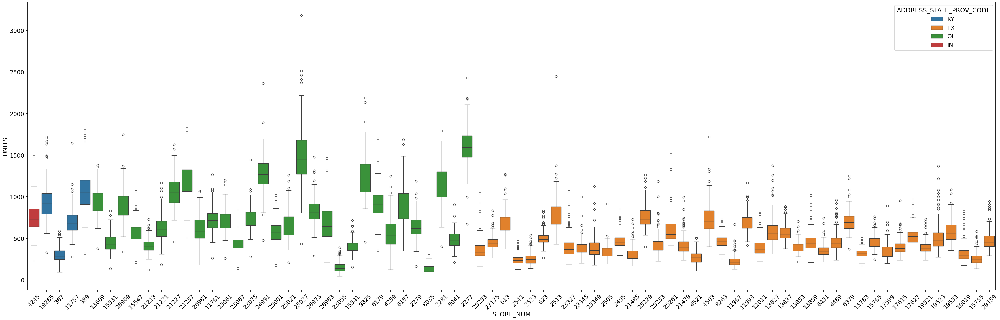

In [133]:
plt.figure(figsize=(50,15))

ax=sns.boxplot(x="STORE_NUM",y="UNITS",data=grouped_weekly_sales, hue ='ADDRESS_STATE_PROV_CODE', order =state)
plt.xticks(rotation=45)

- The most frequent colors we see are green and orange - Ohio and Texas
- Mostly the number of units is higher for Ohio (considering individual stores)

## Store Size and unit sales

- Size of Store: Stores with larger area would have more sales

In [134]:
store_agg_data = train.groupby(['STORE_NUM'])['UNITS'].sum().reset_index()
merged_store_data = store_data.merge(store_agg_data, how = 'left', left_on = 'STORE_ID', right_on = 'STORE_NUM')

<Axes: xlabel='SALES_AREA_SIZE_NUM', ylabel='Density'>

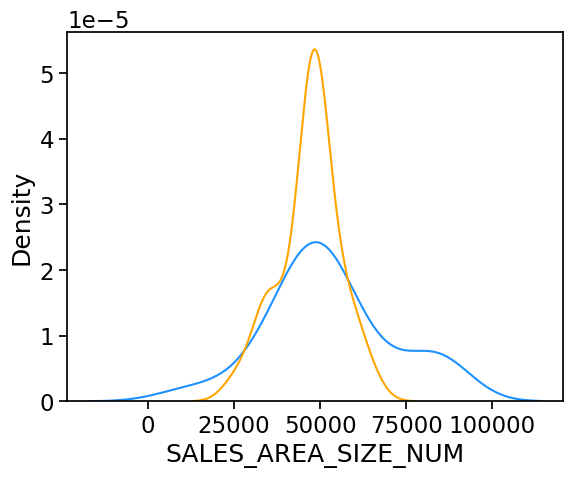

In [135]:
state_oh = merged_store_data.loc[merged_store_data['ADDRESS_STATE_PROV_CODE'] == 'OH']
state_tx = merged_store_data.loc[merged_store_data['ADDRESS_STATE_PROV_CODE'] == 'TX']

sns.distplot(state_oh['SALES_AREA_SIZE_NUM'], hist=False,color= 'dodgerblue', label= 'OHIO')
sns.distplot(state_tx['SALES_AREA_SIZE_NUM'], hist=False,  color= 'orange', label= 'TEXAS')


<Axes: xlabel='SALES_AREA_SIZE_NUM', ylabel='UNITS'>

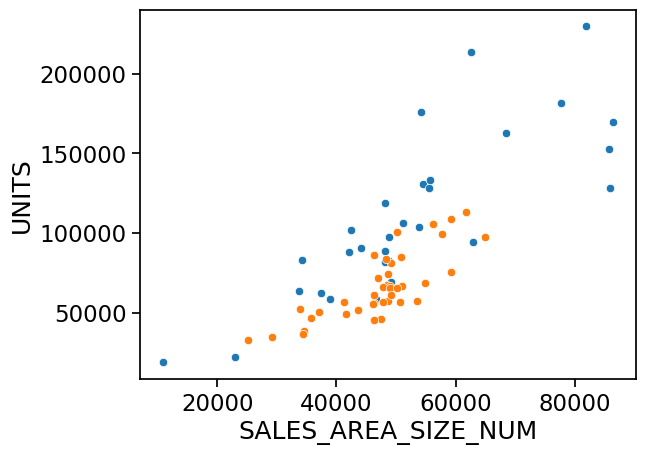

In [136]:
sns.scatterplot(x = (state_oh['SALES_AREA_SIZE_NUM']), y = (state_oh['UNITS']))
sns.scatterplot(x = (state_tx['SALES_AREA_SIZE_NUM']), y = (state_tx['UNITS']))